# The Hofstadter butterfly and Toda chain

In this notebook we will be exploring the relationship between the Hofstadter butterfly and the relativistic Toda lattice. Furthermore, we will delve a bit deepr into the integrability of Toda chains.

For the latter, we suggest this reference: 
 - https://arxiv.org/abs/1606.01894
 - https://arxiv.org/pdf/2304.05466.pdf,
 - https://arxiv.org/pdf/hep-th/0102180.pdf,
 - https://arxiv.org/pdf/1511.02860.pdf

### Note

In case you are using `venv`, you need to launch the following command before being able to run the jupyter notebook with the appropriate kernel:

```
python -m ipykernel install --user --name=<virtualenv_name>
```

Then, inside jupyter lab, check the top right to use the kernel named `<virtualenv_name>`.

In [1]:
# conveniente scripts
%reload_ext autoreload
%autoreload 2

# imports
import numpy as np
import pandas as pd
import plotly.express as px
import itertools
import math
from scipy.optimize import curve_fit, least_squares


def isprime(num):
    a=2
    while a<=math.sqrt(num):
        if num%a<1:
            return False
        a=a+1
    return num>1

def tensor_product(*args):
    """ compute the tensor product of a list of matrices """
    if len(args) == 1:
        return args[0]
    temp = args[0]
    for i in range(1, len(args)):
        temp = np.kron(temp, args[i])
    return temp

def direct_sum(a, b):
    """ direct sum of two matirces """
    dsum = num.zeros( np.add(a.shape,b.shape) )
    dsum[:a.shape[0],:a.shape[1]]=a
    dsum[a.shape[0]:,a.shape[1]:]=b
    return dsum

## Define the Hofstadter model


The Hofstadter hamiltonian is a 2D lattice model with tight binding and a perpendicular magnetic field. Hence, it is described by an eigenvalue equation of the form

$$\psi(n+1)+\psi(n-1)+2 \cos(2 \pi n \alpha +\nu)\psi(n) = E \psi(n),$$

where $\alpha$ is the magnetic flux.

We leverage the Sylvester representation of the Clifford algebra to build the hamiltonian in the next section. We will see that the $U$ matrix corresponds to shift in lattice sites, while the $V$ matrix to rotations to the phase that is site dependent.




In [2]:
lattice_size = 100  # lattice size
alpha=0.0001  # magnetic flux
R = 1  # anisotropy
nux = 0  # brillouin zone x position
nuy = 0  # brillouin zone y position

def hamiltonian_hof(alpha, R):
    omega = np.exp(1j*2*np.pi*alpha)
    U = np.zeros((lattice_size, lattice_size))
    U = np.matrix([[1 if j==(i-1)%lattice_size else 0 for i in range(len(U[j]))] for j in range(len(U))])
    V = np.zeros((lattice_size, lattice_size))
    V = np.matrix([[omega**i if j==i else 0 for i in range(len(V[j]))] for j in range(len(V))])

    H = np.exp(1j*nux)*U + np.exp(-1j*nux)*U.T + R*(np.exp(1j*nuy)*V + np.exp(-1j*nuy)*V.H)
    return H, U, V


### Hamiltonian

The hamiltonian can be written as:

$$H = e^{i\nu_x} U +e^{-i\nu_x} U^\dagger +R(e^{i\nu_y} V +e^{-i\nu_y} V^\dagger )$$

The matrix $V$ depends on the parameter $\alpha$, i.e. the magnetic flux. 

$R$ is the anisotropy and in our case will be fixed to $R=1$.

Harper's equation - i.e. the hamiltonian equations for the above Ansatz - has the particular property that the solutions depend on the rationality of $\alpha$ . By imposing periodicity over 
$n$, one can show that if $\alpha =P/Q$ (a rational number), where 
$P$ and $Q$ are distinct prime numbers, there are exactly $Q$ energy bands. For large 
$Q>>P$, the energy bands converge to thin energy bands corresponding to the Landau levels.

The union of all 
$\epsilon _{\alpha }$ forms a self-similar fractal that is discontinuous between rational and irrational values of 
$\alpha$. 

### Why these operators?

This result is in line with Hofstadter Ansatz: he wrote the generic solution in the lattice $(m,n)$ as $g_me^{i \nu n}$. Both operators $e^{iq}$ and $e^{ip}$ would correspond to translations (as per the *hopping* of the electrons from different adjacent sites as per the tight binding), but they act on an asymmetric solution w.r.t. to the two lattice directions: $g_me^{i \nu n}$ indeed. This explains the action of the two operators (as opposed simply to two translation operators in the $x$ and $y$ directions).

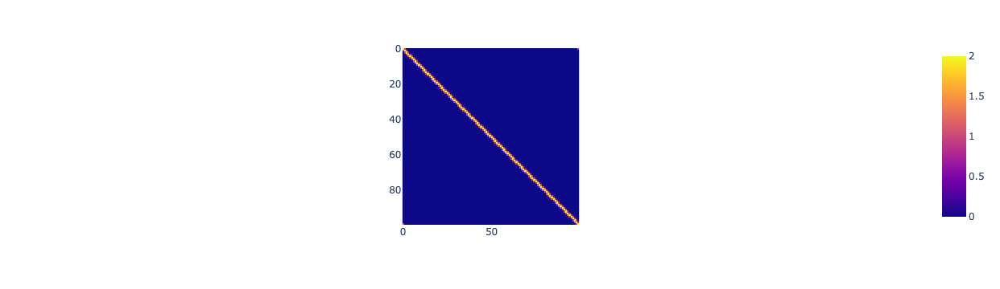

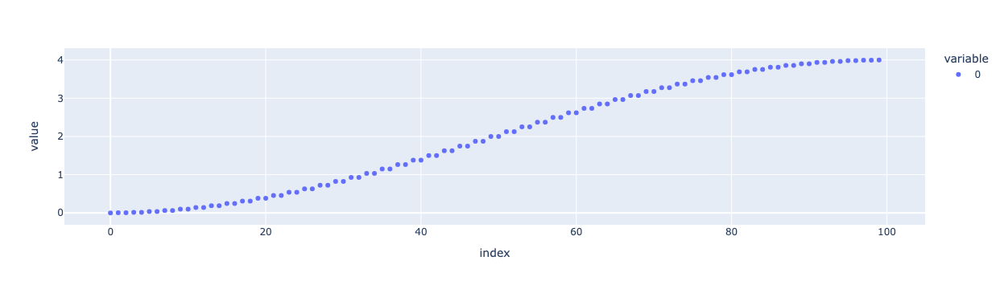

In [3]:
H, U, V = hamiltonian_hof(alpha, R)

spectrum = np.linalg.eigvalsh(H)

fig = px.imshow(np.real(H)+np.imag(H))
fig.show()
px.scatter(spectrum)

### Computing the butterfly

We now plot the spectrum while varying $\alpha$.

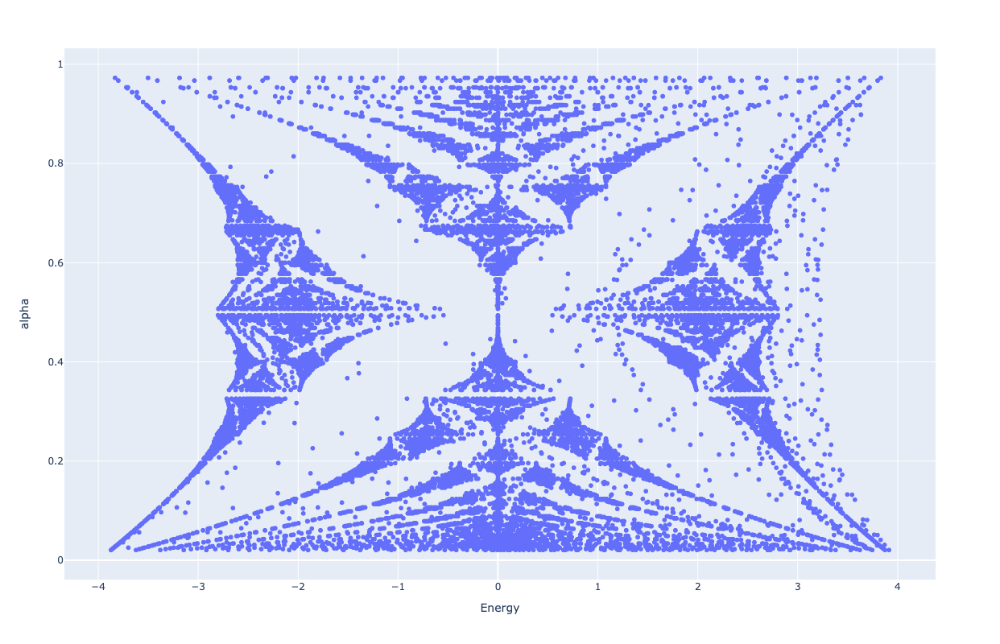

In [4]:
## here nux = nuy = 0
alphas = [P/Q for P in range(100) for Q in range(1, 100) if P/Q <=1 and np.gcd(P,Q) == 1 and isprime(P) and isprime(Q)]
alphas.sort()
data = [[[alpha, eigval] for eigval in list(np.linalg.eigvalsh(hamiltonian_hof(alpha, R)[0]))] for alpha in alphas]
#print(data)
data_df = list(itertools.chain(*data))
#print(data_df)

df = pd.DataFrame(data_df,columns=["alpha","Energy"]) 

fig = px.scatter(df, x = "Energy", y = "alpha",width=1200, height=800)
fig.show()

## Toda lattice for N particles, relativistic

This lattice model describes $N$ particles interacting in a 1D lattice with the nearest negihbour interaction and an exponentially decaying interaction.

This model's hamiltonian (in its most generic form) can be written as follows:

$$ H(N) = \sum_{n=1}^{N/2}(1 + R^2 e^{q_n-q_{n+1}})e^{R p_n} + \sum_{n=1}^{N/2}e^{-R p_n}(1 + R^2 e^{q_{n-1}-q_n})$$

Let's recall that the $e^{i R p }$ is the translation operator by $+R$ on the lattice sites. Thus, an upper triangular matrix. $e^{q_n-q_{n+1}}$ is just a multiplication by a complex number that is site dependent.

Finally, we also change $q_i \to 2 \pi i \alpha q_i$ to integrate $\alpha$ explicitly.

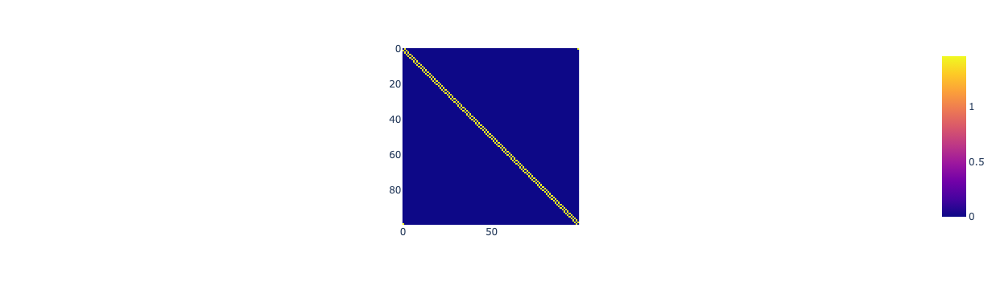

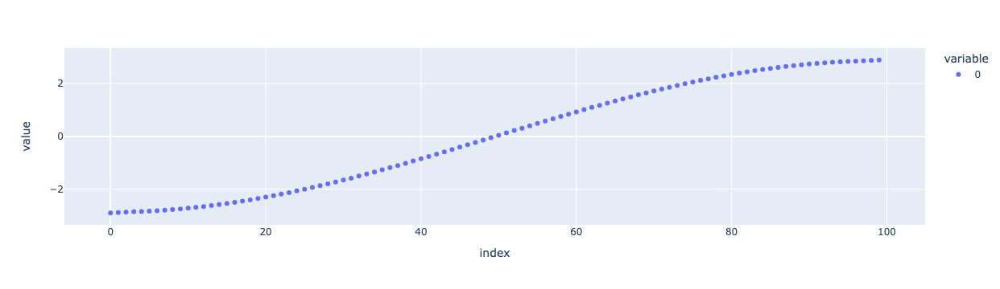

In [5]:
lattice_size_i = 100
N=2

def hamiltonian_toda(alpha, N=2):
    assert N%2 == 0
    
    N=N//2  # as per the formula above
    H_tot = np.zeros((lattice_size_i**N, lattice_size_i**N))
    omega = np.exp(1j*2*np.pi*alpha)
    Id = np.eye(lattice_size_i)
    Ui = np.zeros((lattice_size_i, lattice_size_i))
    Ui = np.matrix([[-1j if j==(i-1)%lattice_size_i else 0 for i in range(len(Ui[j]))] for j in range(len(Ui))])
    Vi = np.zeros((lattice_size_i, lattice_size_i))
    Vi = np.matrix([[-1j*omega**i if j==i else 0 for i in range(len(Vi[j]))] for j in range(len(Vi))])
    # here we need to build the tensor product hilbert space for each particle
    #H2 = tensor_product(Ui,Id) + tensor_product(Vi@Ui,Vi.H) + \
    #    tensor_product(Id,Ui) + tensor_product(Vi.H,Vi@Ui)
    for n in range(N):
        list_tens_1 = [Ui if index == n else Id for index in range(N)]
        list_tens_2 = [Vi@Ui if index == n else (Vi.H if index == (n+1)%N else Id) for index in range(N)]
        list_tens_3 = [Ui.H if index == n else Id for index in range(N)]
        list_tens_4 = [Ui.H@Vi.H if index == n else (Vi if index == (n+1)%N else Id) for index in range(N)]
        H = tensor_product(*list_tens_1) + tensor_product(*list_tens_2) 
        Hdagger = tensor_product(*list_tens_3) + tensor_product(*list_tens_4)
        H_tot = H_tot + H + Hdagger
    assert np.allclose(H_tot, H_tot.H, 1e-8), "non hermitean!"
    return H_tot, Ui, Vi

H, Ui, Vi = hamiltonian_toda(alpha,N)

spectrum = np.linalg.eigvalsh(H)

fig = px.imshow(np.abs(H))
fig.show()
px.scatter(spectrum)

### Can we still get a butterfly?

Given the formal similarity of the Hofstadter and Toda equations for $N=2$, can we get the butterfly back?

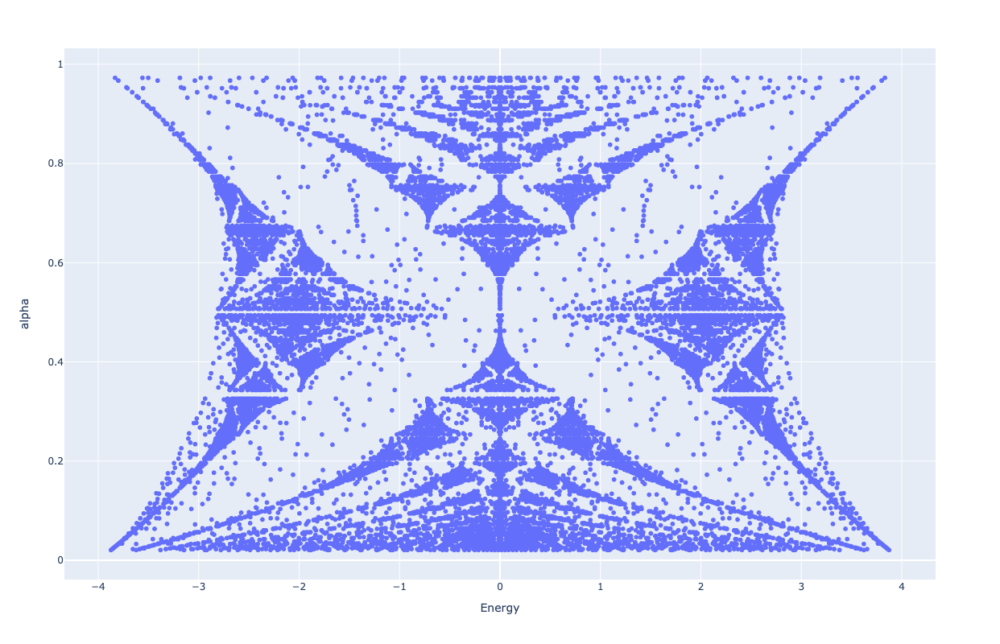

In [6]:
## here nux = nuy = 0
alphas = [P/Q for P in range(100) for Q in range(1, 100) if P/Q <=1 and np.gcd(P,Q) == 1 and isprime(P) and isprime(Q)]
alphas.sort()
data = [[[alpha, eigval] for eigval in list(np.linalg.eigvalsh(hamiltonian_toda(alpha)[0]))] for alpha in alphas]
#print(data)
data_df = list(itertools.chain(*data))
#print(data_df)

df = pd.DataFrame(data_df,columns=["alpha","Energy"]) 

fig = px.scatter(df, x = "Energy", y = "alpha",width=1200, height=800)
fig.show()

## Connecting Toda with Hofstadter model

There are a few points one needs to highlight.

First, we need to take $N=2$ in relativitstic Toda and set $x:= q_1-q_2-p_1$, and $p:=p_1=-p_2$ because we are in the center of masses. Note that the operator $VU$ corresponds directly to $e^x$.

Thus, from the formula above, the equation becomes the equation of Hofstadter:

$$H_{Toda, N=2}=(e^p+e^x) + (e^{-p} + e^{-x})=\tilde U + \tilde U^\dagger + \tilde V + \tilde V^\dagger.$$

The final observation is that the Toda model is equivalent to the Hofstadter model by a Wick rotation: $x \to iq$ and $x+p \to i p$.

Given this, the two models have the same hamiltonian and thus all the physics. And this is clear from the spectrum we obtained (the butterfly).

### Baxter equation

The eigenvalues equation is also close to the Hofstadter one, except that "cos" is replaced by "cosh":
$$\psi(x + i) + \psi(x − i) = T(x)\psi(x), T(x) = R^{−2}(E − 2 cosh(x)).$$

## Toda Hierarchy

Toda lattice is a *completely integrable* system, i.e. a system in which we can find enough conserved quantities to describe the dynamics.

In the special case of Hamiltonian systems (like the Toda lattice), if there are enough independent Poisson commuting first integrals (the hamiltonians $H_k$'s) for the flow parameters to be able to serve as a coordinate system on the invariant level sets (the leaves of the Lagrangian foliation), and if the flows are complete and the energy level set is compact, this implies the Liouville-Arnold theorem; i.e., the existence of action-angle variables. Frobenius' theorem states that a subbundle $E$ is integrable if and only if the subbundle $E$ arises from a regular foliation of the manifold $M$. Check the **appendix** for more details.

### Note

In the case of the comparison with the Hofstadter model, we had to use $e^{q_n-q_{n+1}}$ and associate this difference to the `Vi` matrix. However, this only works in the center of mass frame and only in the case of N=2.

Thus, we have to now change the formalism and properly use the tensor products. From now on:

$$ H(N) = \sum_{n=1}^{N}(1 + R^2 e^{q_n-q_{n+1}})e^{R p_n}$$

Thus, we need to define the matrices $U_n$ and $V_n$ corresponding to the operators $e^{p_n}$ and $e^{q_n}$.

Finally, note that this hamiltonian is missing the hermitian conjugate: we will add it only for the spectrum computaiton.

This is the standard Toda hamiltonian


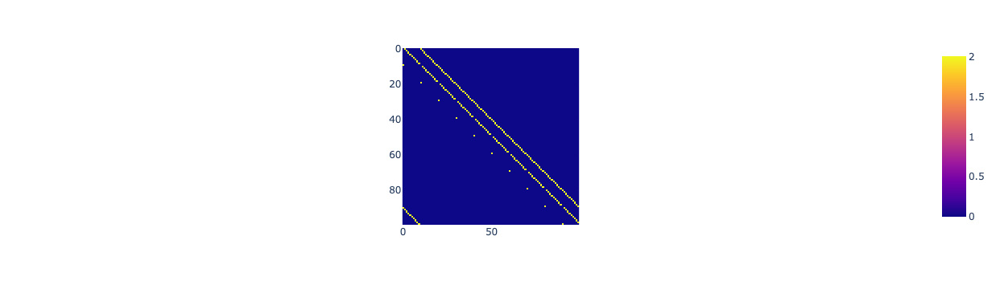

In [7]:
lattice_size_n = 10
N = 2
alpha = 0.001

def hamiltonian_toda_std(alpha, N):

    omega = np.exp(alpha)
    H_tot = np.zeros((lattice_size_n**N, lattice_size_n**N))
    Id = np.eye(lattice_size_n)
    Un = np.zeros((lattice_size_n, lattice_size_n))
    Un = np.matrix([[1 if j==(i-1)%lattice_size_n else 0 for i in range(len(Un[j]))] for j in range(len(Un))])
    Vn = np.zeros((lattice_size_n, lattice_size_n))
    Vn = np.matrix([[omega**i if j==i else 0 for i in range(len(Vn[j]))] for j in range(len(Vn))])
    for n in range(N):
        list_tens_1 = [Un if index == n else Id for index in range(N)]
        list_tens_2 = [Vn@Un if index == n else (np.linalg.inv(Vn) if index == (n+1)%N else Id) for index in range(N)]
        #list_tens_3 = [Un.H if index == n else Id for index in range(N)]
        #list_tens_4 = [Un.H@np.linalg.inv(Vn) if index == n else (Vn if index == (n+1)%N else Id) for index in range(N)]

        H = tensor_product(*list_tens_1) + tensor_product(*list_tens_2) 
        #Hdagger = tensor_product(*list_tens_3) + tensor_product(*list_tens_4)

        H_tot = H_tot + H #+ Hdagger
    #assert np.allclose(H_tot, H_tot.H, 1e-8), "non hermitean!"
    return H_tot, Un, Vn, H_tot+H_tot.H


H, Un, Vn, _ = hamiltonian_toda_std(alpha, N)
print("This is the standard Toda hamiltonian")
px.imshow(H).show()

### Spectrum of the standard Toda

For an imaginary $\alpha$, and also adding the h.c. to the hamiltonian, the spectrum looks somehow similar to the Hofstadter butterfly. More thorough analysis is needed here to deeply understand their relationship.

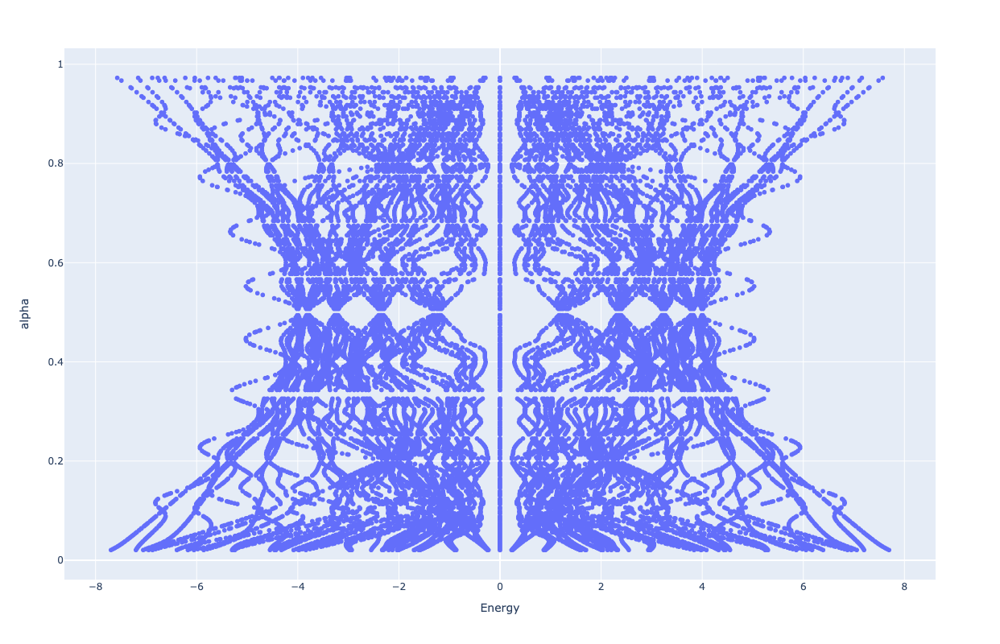

In [8]:
## here nux = nuy = 0
alphas = [P/Q for P in range(100) for Q in range(1, 100) if P/Q <=1 and np.gcd(P,Q) == 1 and isprime(P) and isprime(Q)]
alphas.sort()
data = [[[alpha, eigval] for eigval in list(np.linalg.eigvalsh(hamiltonian_toda_std(1j*2*np.pi*alpha,N)[-1]))] for alpha in alphas]
#print(data)
data_df = list(itertools.chain(*data))
#print(data_df)

df = pd.DataFrame(data_df,columns=["alpha","Energy"]) 

fig = px.scatter(df, x = "Energy", y = "alpha",width=1200, height=800)
fig.show()

### How to find the other hamiltonians

First we need to find the Lax matrix (detailes omitted), which allows us to do all the hamiltonians computations.

The Lax matrix is (for $z \in \mathbb C)$

$$L_n(z, R) = 
  \left[ {\begin{array}{cc}
   z-z^{-1}e^{Rp_n} & Re^{-q_n} \\
   -Re^{q_n+Rp_n} & 0 \\
  \end{array} } \right] 
$$

Describe the monodromy polynomial from the Lax matrix:

$$M(z) = \prod_n^NL_n(z, R)$$

In the next section we will see how to extract the hamiltonians.

In [9]:
def lax(n, z=1, N=2):
    assert n <= N, "n is larger than N"
    Id = np.eye(lattice_size_n)
    # z is a parameter!! needed to extract hamiltonians!
    list_11 = [z*Id - z**(-1)*Un if index == n else Id for index in range(N)]
    list_12 = [np.linalg.inv(Vn) if index == n else Id for index in range(N)]
    list_21 = [-Vn@Un if index == n else Id for index in range(N)]
    Lax = np.vstack((np.hstack((tensor_product(*list_11),tensor_product(*list_12))),
                     np.hstack((tensor_product(*list_21),np.zeros((lattice_size_n**N,lattice_size_n**N))))))
    return Lax

#px.imshow(lax(0, 1, N)).show()
#px.imshow(lax(1, 1, N)).show()

This is the monodromy matrix:


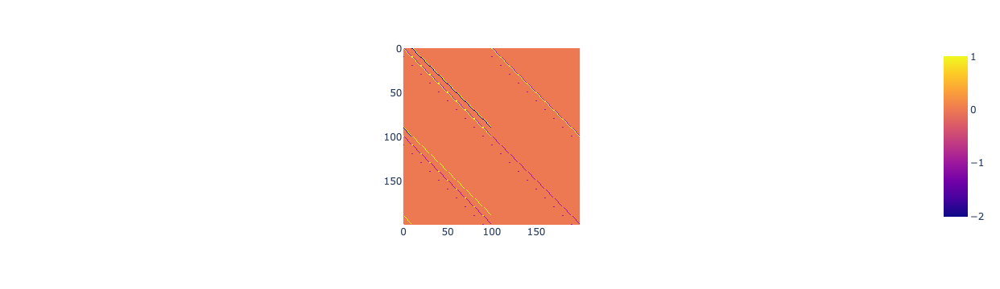

In [10]:
def block_product(a=None,b=None,size=1):
    assert np.all(a.shape == b.shape)
    c = np.zeros(a.shape)
    c[:size,:size] = a[:size,:size]@b[:size,:size]+a[:size,size:]@b[size:,:size]
    c[size:,:size] = a[size:,:size]@b[:size,:size]+a[size:,size:]@b[size:,:size]
    #print(a[:size,:size],b[:size,size:],a[:size,size:],b[size:,size:])
    c[:size,size:] = a[:size,:size]@b[:size,size:]+a[:size,size:]@b[size:,size:]
    c[size:,size:] = a[size:,size:]@b[size:,size:]+a[size:,:size]@b[:size,size:]
    return c

a = np.matrix(np.random.random((2,2)))
b = np.matrix(np.random.random((2,2)))

# unit test
assert np.allclose(block_product(a,b,1) , a@b, 1e-9)

def monodromy_f(z=1, N=2):
    monodromy = np.eye(len(lax(0,z,N)))
    for i in range(N):
        monodromy = block_product(lax(i,z,N), monodromy, len(monodromy)//2)
    return monodromy

print("This is the monodromy matrix:")
px.imshow(monodromy_f(1,N))

This is the block trace of the monodromy


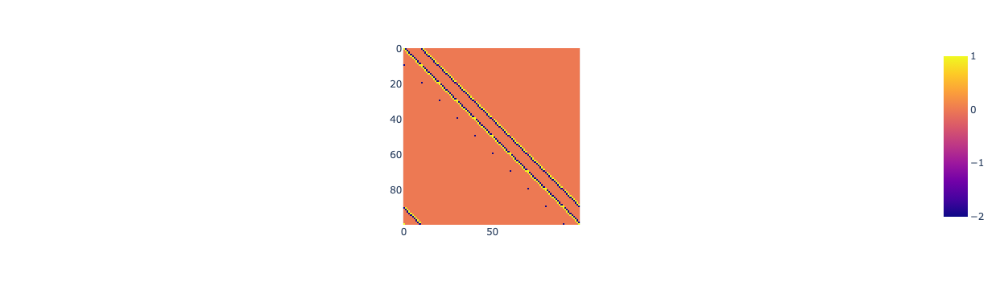

In [11]:
def monodromy_trace(mon, z=1, N=2):
    mon = mon(z,N)
    trace = mon[:lattice_size_n**(N),:lattice_size_n**(N)]
    for n in range(1, 2):
        #px.imshow(np.abs(trace)).show()
        trace = trace + mon[lattice_size_n**(N)*n:lattice_size_n**(N)*(n+1),
            lattice_size_n**(N)*n:lattice_size_n**(N)*(n+1)]
    return trace

print("This is the block trace of the monodromy")
px.imshow(monodromy_trace(monodromy_f, 1, N)).show()

### Find hamiltonians

In order to find all the Toda hamiltonians $H_k$ we leverage the following relation with the monodromy trace $Tr(M(z,N))$

$$ Tr(M(z,N)) = \sum_k^N H_k z^{N-2k}(-1)^k $$

Since we do not have a symbolic computation at hand, we evaluate the trace is a few points and then we interpolate.

For $N=2$, one can easily do the matrix multiplication and will get: 
$$H_0 =1, H_1 = H, H_2 = e^{Rp_1+Rp_2}$$

This is H0:


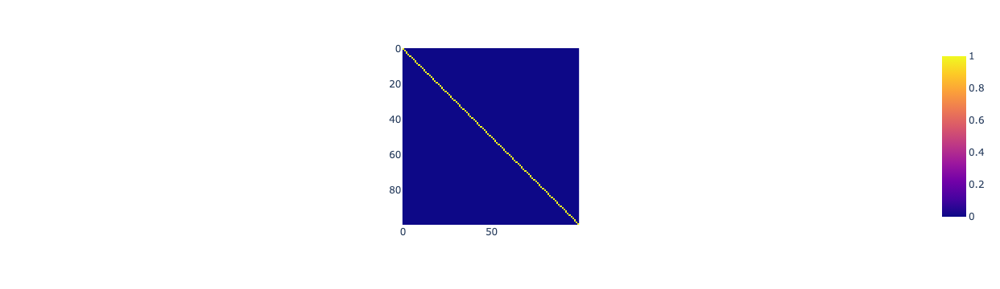

This is H1:


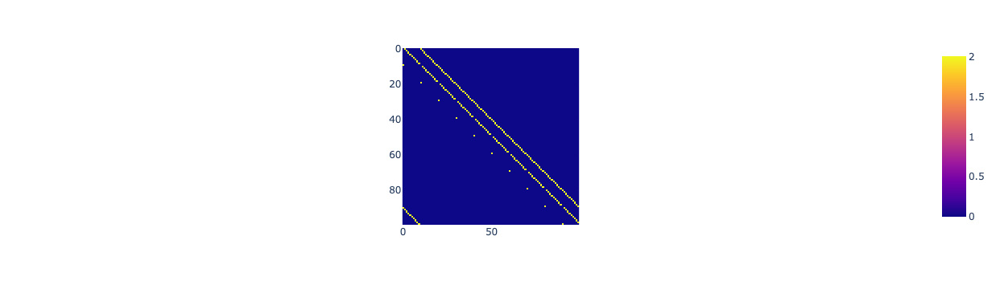

This is H2:


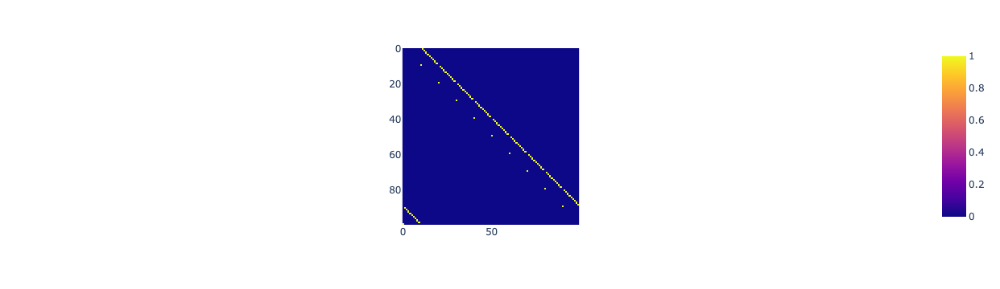

This is Tr(M):


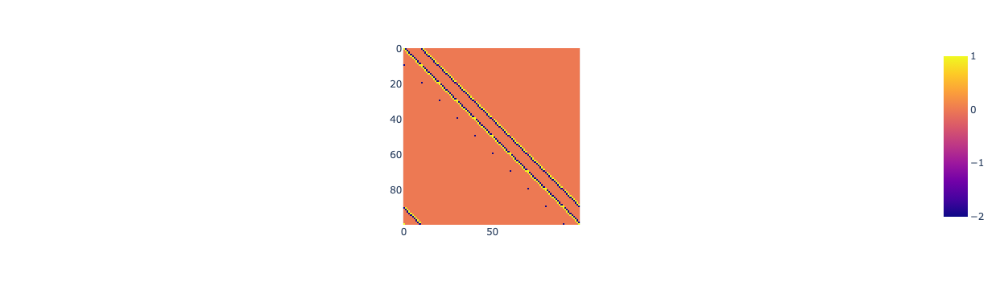

In [12]:
# since we know the solutions, let's check it out!
H0 = np.eye(len(H))
H2 = tensor_product(Un,Un)
trM = H0-H+H2
assert np.allclose(monodromy_trace(monodromy_f, 1, N), trM,1e-8)
print("This is H0:")
px.imshow(H0).show()
print("This is H1:")
px.imshow(H).show()
print("This is H2:")
px.imshow(H2).show()
print("This is Tr(M):")
px.imshow(trM).show()


In the cell below we leverage the polynomial interpolation capacity of `scipy` to get a numerical result, assuming we were not knowing the shape of the hamiltonians a priori.

This is H_0 : 


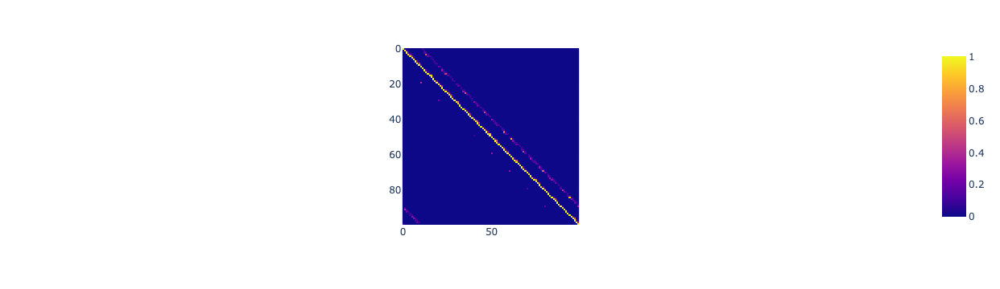

This is H_1 : 


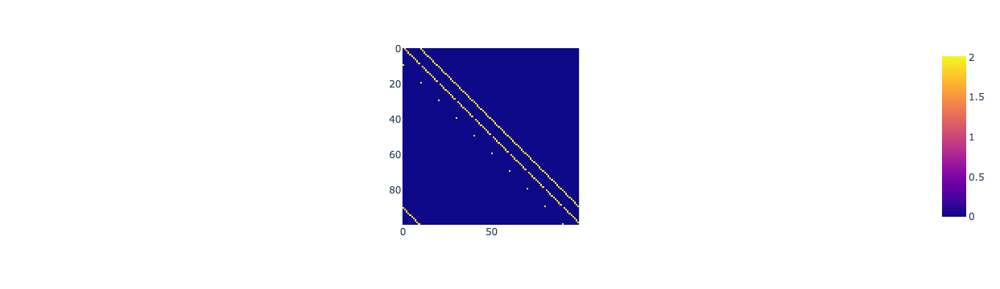

This is H_2 : 


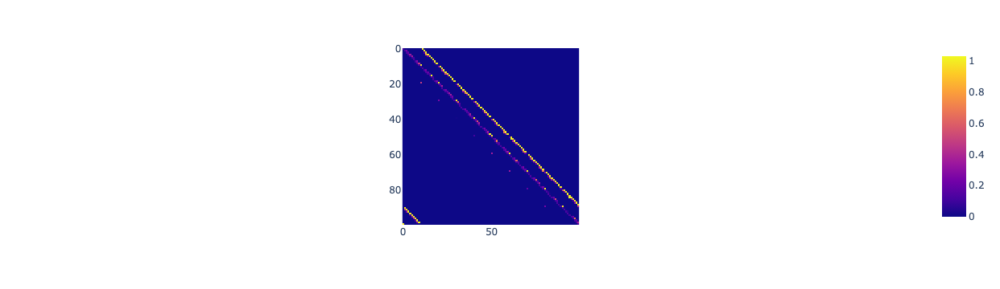

In [13]:
data_x_real = list(np.arange(1., 3.*(N+1)))
#data_x = list(itertools.chain(*zip(list(range(1, 3*(N+1))), [0]*(N))))
#print(data_x_real, data_x)
data_raw = [monodromy_trace(monodromy_f, kk, N) for kk in data_x_real]
#print(data_raw)
data = np.zeros((lattice_size_i**(N//2),lattice_size_i**(N//2)),dtype=object)
results = np.zeros((lattice_size_i**(N//2),lattice_size_i**(N//2)),dtype=object)


params = ["a"+str(i) for i in range(2*(N+1))]
#params_k = {"a"+str(i):1 for i in range(N)}
for j in range(N):
    globals()["a"+str(j)]=1

def lq_f(x,t,y):
    """x = parameters to optimise, 
    t=indep var, i.e. the datum, 
    y=dep var, i.e. the label
    """
    #print("x,t,y:", x, t, y)
    #print([(t[j]+1j*t[j+1]) for j in range(0,len(t),2)])
    #print([(x[2*k]+1j*x[2*k+1]) for k in range(N+1)])
    #return [np.abs(sum([(t[j])**(N-2*k)*(-1)**k*(x[2*k]+1j*x[2*k+1]) for k in range(N+1)])-y[j]) for j in range(len(t))]
    return np.abs(sum([np.power(t,(N-2*k))*(-1)**k*(x[2*k]+1j*x[2*k+1]) for k in range(N+1)])-y) + \
        np.imag(sum([np.power(t,(N-2*k))*(-1)**k*(x[2*k]+1j*x[2*k+1]) for k in range(N+1)])-y)

for i in range(lattice_size_i**(N//2)):
    for j in range(lattice_size_i**(N//2)):
        data[i][j] = [mon[i,j] for mon in data_raw]
        #popt, _ = curve_fit(fit_f, data_x, data[i][j])
        if np.abs(sum(data[i][j])) < 1:
            x0 = 0.
        else:
            x0 = 1.5
        popt = least_squares(lq_f,[x0]*len(params),args=(data_x_real, data[i][j]), ftol=1e-12)
        results[i][j] = [popt.x[idx] + 1j*popt.x[idx+1] for idx in range(0,len(popt.x),2)]
        #print("result:",results[i][j], "data:", data[i][j], popt.cost)

Hk = []

for k in range(N+1):
    Hk.append([[results[i][j][k] for j in range(lattice_size_n**(N))] for i in range(lattice_size_n**(N))])
    print(f"This is H_{k}",": ")
    px.imshow(np.abs(np.array(Hk[k]))).show()


Besides some small numerical errors, the hamiltonians are found correctly!

## Relation to quantum groups

Quantum groups are universal enveloping algebras of a lie algebra. Let's focus on

$$U_q(sl_2(\mathbb C))$$

It is generated by the following relations among the generators $E, F, K^{\pm1}$.

$$KE = q^2EK$$
$$KF = q^{-2}FK$$
$$EF − FE = \frac{K − K^{-1}}{q − q^{-1}}$$
where $q = e^{i \pi \tau}$, $\tau \in \mathbb C$.

The center is generated byt the Casimir:
$$C_2 = qK + q^{−1}K^{−1} + (q − q^{−1})^2FE.$$

Guess what? The matrices $U$ and $V$ are a representation of the quantum group if properly mapped to the generators. See below.

In [14]:
# non commutative torus relation
alpha = 0.0001
omega = np.exp(1j*2*np.pi*alpha)
assert np.allclose((U@V@U.H@V.H)[1:-1,1:-1] ,np.eye(lattice_size-2)*omega,1e-10)  # excluding boundaries because of numerical issues

In [15]:
q = omega**(1/2)
assert np.allclose(np.linalg.inv(V), V.H, 1e-8)
assert np.allclose(np.linalg.inv(U), U.H, 1e-8)

# define the generators
E = V.H@(np.eye(lattice_size)-U.H)/(q-q**(-1))
K = U.H
F = q*V@(np.eye(lattice_size)-U)/(q-q**(-1))

In [16]:
assert np.allclose((E@F-F@E)[1:-1,1:-1], (K-K.H)[1:-1,1:-1]/(q-q**(-1)), 1e-10) # excluding the boundaries as there are issues

In [17]:
assert np.allclose((K@F)[1:-1,1:-1], q**(-2)*(F@K)[1:-1,1:-1], 1e-10)

In [18]:
assert np.allclose((K@E)[1:-1,1:-1], q**2*(E@K)[1:-1,1:-1], 1e-1)

### Modular dual in quantum groups



## Calabi-Yau and Mirror Symmetry

Mirror symmetry exchanges the Kähler and complex structures of the corresponding Calabi-Yau manifolds.

### Example on elliptic curves

In the case of elliptic curves (which can be though of a 1D Calabi-Yau as they have a complex structure, curvature is zero - and thus have a non-vanishing holomorphic volume form $dz$ - , and a symplectic one), how does mirror symmetry act?

An elliptic curve is a complex 1D manifold defined as the quotient of $E:=\mathbb C/(\mathbb Z \oplus \tau \mathbb Z)$. $\tau \in H$ (the upper half plane)  defines the complex structure of $E$. Of course, there are different complex numbers that give rise to the same complex structure: this is where modular symmetry $SL_2(\mathbb Z)$ plays a role in defining the moduli space of elliptic curves as complex manifolds (the story of the Teichmuller space however is not for this notebook).

For the rest of the example, let's take $\tau = i \gamma$, $\gamma \in \mathbb R^+$.

Elliptic curves have a real structure as well. Furthermore, the symplectic structure (which is a 2-form in $H^2(E,\mathbb R)$) on elliptic curves $\omega$ exists because $H_2(E,\mathbb R)=\mathbb R$ and thus it is determined by a real number $a$:

$$\omega = a dx \wedge dy =
  \left[ {\begin{array}{cc}
   0 & a \\
   -a & 0 \\
  \end{array} } \right] = \frac{a}{2i} dz \wedge d\bar z
$$

Given all the above, let's call $\int_E \omega = \lambda$. The mirror curve is $E^\vee:=\mathbb C/(\mathbb Z \oplus i\lambda \mathbb Z)$ and $\int_{E^\vee} \omega^\vee = \gamma$.

### A note on HMS

If $(M, J, \omega)$ and $(M^\vee, J^\vee, \omega^\vee)$ are mirror manifolds, then
$$ D^bFuk(M,\omega) = D^bCoh(M^\vee, J^\vee)$$
$$ D^bCoh(M, J) = D^b Fuk(M^\vee, \omega^\vee)$$
are equivalences of categories.

### Hofstadter and CY

In the case of the following Calabi-Yau manifold (written as hypersurface in $4D$ over $\mathbb C$ ):
$$ V W = e^X + e^{-X} + e^Y + e^{-Y}$$
it's Mirror dual is the local $\mathbb P^1 \times \mathbb P^1$. 

Hence, we conclude that the quantized (note that we need to promote the coordinates $X$ and $Y$ to operators!) mirror
curve for the local $\mathbb P^1 \times \mathbb P^1$ is related to the quantum eigenvalue problem of the relativistic
Toda lattice with just two particles (a.k.a. Hofstadter model).

Note also that the above CY is fully described by the Riemann surface of genus 1 give by (written as hypersurface in $2D$ over $\mathbb C$ ):
$$E = e^X + e^{-X} + e^Y + e^{-Y} $$

## Appendix - intro to symplectic geometry

In this appendix we make a very concreate and quick intro to the main basic concepts of integrable systems. All of this revolves around the simplest example: the harmonic oscillator.

The hamiltonian is:
$$H = q^2 + p^2$$

The flow vector field is:
$$X_H = (\frac{\partial H}{\partial p}, - \frac{\partial H}{\partial q})$$

The **leaves** are given by $H=const$, so cirlces! All the levaes (Lagrangian submanifolds in higher dimensions) together form a **foliation**. The associated tangent bundle is generated by $X_H$ restricted on the leaf $H=const$ (check below the quiver plot).

The **integrable distribution** is given by the family of tangent bundles $T\{H=const\}$, and $const$ is the parameter characterising the family. So the single item of the distribution is the bundle generated by the tangent vectors to one of the circles defined by $H=const$.

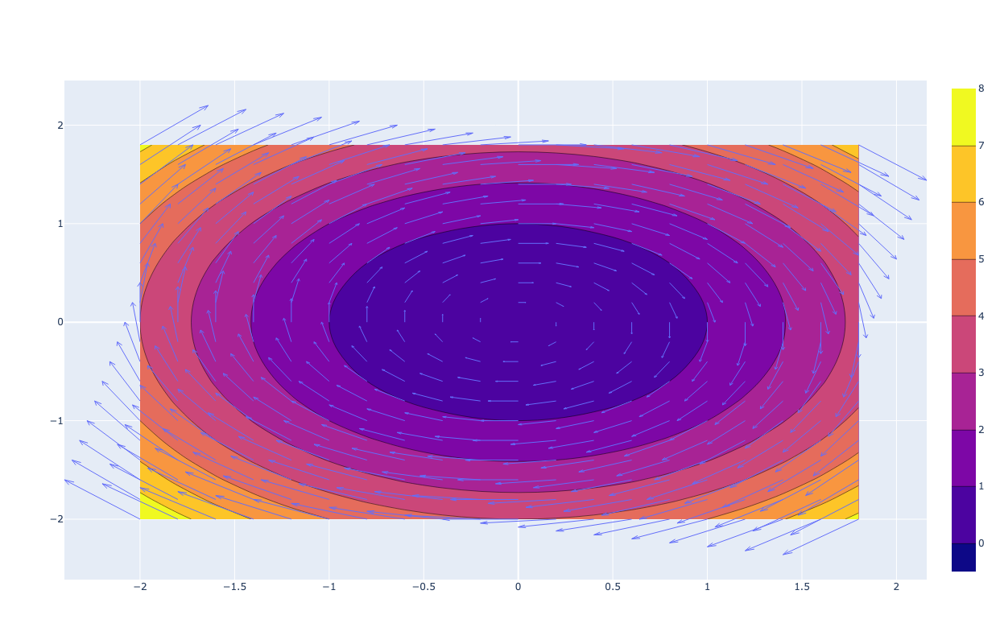

In [19]:
import plotly.figure_factory as ff
import plotly.graph_objects as go

p,q = np.meshgrid(np.arange(-2, 2, .2),
                  np.arange(-2, 2, .2))

H = p**2 + q**2  # this is the hamiltonian
dHdp,dHdq = 2*p, -2*q  # this is X_H

# Create flow vectors X_H
fig = ff.create_quiver(q, p, dHdp, dHdq,
                       scale=.1,
                       arrow_scale=.1,
                       name='quiver',
                       line_width=1)

# Add the Hamiltonian contours 
fig.add_trace(go.Contour(z=H,x=np.arange(-2, 2, .2),y=np.arange(-2, 2, .2)))
fig.update_layout(width=800, height=800)
fig.show()
